<a href="https://colab.research.google.com/github/abrichr/visual-contact-tracing/blob/master/Distance_Estimation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and Data

This is to test different methods in a very messy environment

In [ ]:

# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.6 torchvision==0.7 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1 cython_bbox
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html
# get configs

# TODO: can we read this from site-packages?
!git clone https://github.com/facebookresearch/detectron2.git
#!python -m pip install -e detectron2

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Requirement already up-to-date: torch==1.6 in /usr/local/lib/python3.6/dist-packages (1.6.0+cu101)
Requirement already up-to-date: torchvision==0.7 in /usr/local/lib/python3.6/dist-packages (0.7.0+cu101)
     |████████████████████████████████| 276kB 2.8MB/s 
     |████████████████████████████████| 51kB 5.6MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=72030831dffbc668a5f15e0b1b2ecfa678642763adb8af0511ded7f9308924ea
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
  Created wheel for cython-bbox: filename=cython_bbox-0.1.3-cp36-cp36m-linux_x86_64.whl size=57159 sha256=1470ec68a60f52d01d74fe1c7e4eb32053e6466a8cd1244b8fa477fcdbd3f602
  Stored in directory: /root/.cache/pip/wheels/2b/31/b5/9246d5988e79ef89dc28b894835d2f305e23c1e5f4f80278ee
Successfully built pyyaml cython-bbox
  Found existing installation:

Cloning into 'detectron2'...
remote: Enumerating objects: 23, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 6452 (delta 6), reused 12 (delta 6), pack-reused 6429
Receiving objects: 100% (6452/6452), 3.14 MiB | 21.00 MiB/s, done.
Resolving deltas: 100% (4527/4527), done.


In [ ]:
import numpy as np
import cv2
import scipy
import scipy.spatial
import random
import pickle

from google.colab import files
from google.colab.patches import cv2_imshow

%tensorflow_version 1.x
import tensorflow

import detectron2
from detectron2.utils import visualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.utils.video_visualizer import VideoVisualizer

import imageio
from keras.models import load_model
from skimage import io

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import os
import glob
import sys
import time

In [ ]:

if 1:
  files.upload() # usually oculus.mp4-reenc.avi and track_boxes.np

UPLOAD_TRACKS = True

if UPLOAD_TRACKS:
  with open('tracks.pickle', mode='rb') as f:
    tracks = pickle.load(f)
    tracks = np.stack(tracks, axis=0)

Saving tracks.pickle to tracks (1).pickle


In [ ]:
# Pull oculus video
if 0:
  ! pip install youtube-dl
  ! youtube-dl https://www.youtube.com/watch?v=ptzKx9voJBY
  video_filename = 'Trippy timelapse of the new Oculus Building in NYC-ptzKx9voJBY.mp4'
  ! mv '$video_filename' oculus.mp4
  video_filename = 'oculus.mp4'

     |████████████████████████████████| 1.8MB 2.5MB/s 
[youtube] ptzKx9voJBY: Downloading webpage
[youtube] ptzKx9voJBY: Downloading MPD manifest
[dashsegments] Total fragments: 9
[download] Destination: Trippy timelapse of the new Oculus Building in NYC-ptzKx9voJBY.f136.mp4
[download] 100% of 11.92MiB in 00:02
[dashsegments] Total fragments: 10
[download] Destination: Trippy timelapse of the new Oculus Building in NYC-ptzKx9voJBY.f140.m4a
[download] 100% of 669.07KiB in 00:01
[ffmpeg] Merging formats into "Trippy timelapse of the new Oculus Building in NYC-ptzKx9voJBY.mp4"
Deleting original file Trippy timelapse of the new Oculus Building in NYC-ptzKx9voJBY.f136.mp4 (pass -k to keep)
Deleting original file Trippy timelapse of the new Oculus Building in NYC-ptzKx9voJBY.f140.m4a (pass -k to keep)


# Utils

In [ ]:
def average_frame(filename):
  """ Returns the average frame of a video located at 'filename'. """
  video = cv2.VideoCapture(filename)
  avg_frame = None
  n = 0

  while video.isOpened():
    ret, frame = video.read()
    n += 1

    if not ret:
      # Video failed to read or ended
      break
    elif avg_frame is None:
      avg_frame = np.zeros(frame.shape, dtype=np.int32)
    
    avg_frame += frame
  
  video.release()
  avg_frame //= n

  return avg_frame.astype(np.uint8)

In [ ]:
def get_background(filename, algo='MOG2'):
  """ Returns the background of the video located at `filename` using OpenCV's
  backgroundsubtractor class and the algorithm `algo`. """
  if algo == 'MOG2':
    backSub = cv2.createBackgroundSubtractorMOG2()
  else:
    backSub = cv2.createBackgroundSubtractorKNN()
  
  video = cv2.VideoCapture(filename)

  while video.isOpened():
    ret, frame = video.read()
    
    if not ret or frame is None:
      break
    
    backSub.apply(frame)
  
  video.release()

  return backSub.getBackgroundImage()

In [ ]:
def resize_frame(frame, dsize=(480, 640), crop='mid', debug=False):
  """ Resize a numpy array (image) to size `dsize` without distortion.
  The crop is to future-proof it, but for this rough a stage is unused."""
  assert len(frame.shape) >= 2
  width, height = frame.shape[1], frame.shape[0]

  d_aspect_ratio = float(dsize[1]) / dsize[0]
  cur_aspect_ratio = float(width) / height
  if debug:
    print("Initial ratio:", cur_aspect_ratio)
    print("Goal ratio:", d_aspect_ratio)
  if cur_aspect_ratio > d_aspect_ratio:
    d_width = int(frame.shape[0] * d_aspect_ratio)
    diff = width - d_width
    frame = frame[:, diff // 2:(width - diff // 2)]
  else:
    d_height = int(height / d_aspect_ratio)
    diff = height - d_height
    frame = frame[diff // 2:(height - diff // 2), :]
  
  if debug:
    print(frame.shape)
    print(frame[0])
  return cv2.resize(frame, (dsize[1], dsize[0]))

In [ ]:
def pull_n_frames_from_video(filename, n_frames=5):
  """ Pulls `n` evenly-ish spaced frames from the video located at
  `filename`. Returns a list of the frames. """
  video = cv2.VideoCapture(filename)
  total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
  frames_per = total_frames // n_frames
  keyframes = []
  n = 0

  while video.isOpened():
    ret, frame = video.read()
    if not ret:
      break
    if n % frames_per == 0:
      keyframes.append(frame)
    
    n += 1
  
  if len(keyframes) > n_frames:
    keyframes = keyframes[:n_frames]

  video.release()
  return keyframes

# Distance Estimation Demo

## Classes

### DepthEstimator

In [ ]:
class DepthEstimator:
  """A depth estimator that handles camera calibration and point transformation.
  
  Uses a homography to calculate distances between points on a plane in
  world-space.

  Attributes:
    _distortion_estimated: A boolean, true iff distortion has been estimated.
    _H_estimated: A boolean, true iff the homography H has been estimated.
    _camera_matrix_estimated: A boolean, true iff the camera matrix has been estimated.
    _scaling_factor_estimated: A boolean, true iff the scaling factor has been estimated.
    _dist_coeffs: A length 4 or 5 the distortion coefficients k_1, k_2, [k_3],
      p_1, p_2 used in computing and correcting the radial (barrel) distortion
      and tangential distortion from the camera lens.
    _H: A 3x3 np.ndarray representing the homography between the pixel
      image and the plane in world-space.
    _camera_matrix: A 3x3 np.ndarray representing the camera matrix.
    _scaling_factor: A float representing the scaling factor between the
      output of the homography and the real world. Converts from pixels to
      meters.
    _units: A string describing the units of the output. User-provided.

  """

  def __init__(self):
    self._distortion_estimated = False
    self._dist_coeffs = None
    self._H_estimated = False
    self._H = None
    self._camera_matrix_estimated = False
    self._camera_matrix = None
    self._scaling_factor_estimated = False
    self._scaling_factor = None
    self._units = None
  
  def print_status(self):
    """Prints the calibration status of the DepthEstimator.

    Prints out if the distortion, homography, camera matrix, and
    scaling factor have been estimated.
    """
    print("Distortion estimated:", self._distortion_estimated)
    print("Homography estimated:", self._H_estimated)
    print("Camera calibrated:", self._camera_matrix_estimated)
    print("Scaling estimated:", self._scaling_factor_estimated)

  def estimate_H_from_chessboard(self, img, board_shape):
    """Estimates and sets a homography H using a chessboard image.
    
    Calculates the homography matrix H between the camera
    image and the plane of the floor by use of a chessboard
    printed and placed on the floor, and then sets self._H.

    Args:
      img: A numpy array picture of the chessboard on the floor
      board_shape: Tuple describing the shape of the chessboard in
        number of squares (columns, rows)
    """
    board_shape = (board_shape[0] - 1, board_shape[1] - 1) #interior corners

    if self._distortion_estimated and self._camera_matrix_estimated:
      img = cv2.undistort(img, self._camera_matrix, self._dist_coeffs)
    
    found, corners = cv2.findChessboardCorners(img, board_shape)
    
    # Initialize the object points from the calibration pattern
    obj_pts = []
    for i in range(board_shape[0]):
      for j in range(board_shape[1]):
        obj_pts.append([i, j])
    obj_pts = np.array(obj_pts, np.float32)

    self.estimate_H_from_points(obj_pts, corners)

    #TODO: find out empirical formula for size of checkers based on
    # number of squares and 8.5" x 11" paper, use this to calculate
    # the scaling factor
  
  def estimate_H_from_points(self, obj_pts, im_pts):
    """Estimates and sets a homography H using matched points.
    
    Calculates the homography matrix H between the camera
    image and the plane of the floor by paired points in `obj_pts`
    and `im_pts`. Point obj_pts[i] must correspond to im_pts[i].
    Sets the homography self._H.

    Args:
      obj_pts: A list or array of 2 dimensional object points, ordered.
      im_pts: A list or array of 2 dimensional pixel coordinates, ordered.
    """
    if type(obj_pts) == np.ndarray:
      obj_pts = obj_pts.astype(np.float32)
    else:
      obj_pts = np.array(obj_pts, np.float32)
    
    if type(im_pts) == np.ndarray:
      im_pts = im_pts.astype(np.float32)
    else:
      im_pts = np.array(im_pts, np.float32)
    
    self._H = cv2.findHomography(im_pts, obj_pts)[0]
    self._H_estimated = np.sum(np.abs(self._H)) != 0
    # ^ opencv returns 0 if estimation fails

  
  def estimate_H_from_rectangle(self, im_pts, aspect_ratio=(1, 1)):
    """Estimates and sets a homography using 4 points in a rectangle.
    
    Estimate the homography from a set of 4 image points which are the corners
    of a rectangle of aspect ratio `aspect_ratio` on the plane.
    The corners are in order [A, B, C, D] with aspect ratio (width, height).
                         width
                      A###########B
                       #           #
                 height #           #
                         #           #
                          C###########D
    
    Args:
      pts: A list or array of 2 dimensional pixel coordinates of the corners of
        the rectangle in order [A, B, C, D].
      aspect_ratio: A tuple describing the aspect ratio of the rectangle.
    """
    if type(im_pts) == np.ndarray:
      im_pts = im_pts.astype(np.float32)
    else:
      im_pts = np.array(im_pts, np.float32)
    
    x, y = aspect_ratio
    obj_pts = np.array([[0, 0], [x, 0], [0, y], [x, y]], np.float32)
    self.estimate_H_from_points(obj_pts, im_pts)

  def calibrate_from_chessboard(self, imgs, board_shape):
    """Calibrates a camera with multiple images of a chessboard in different poses.

    Calibrates a camera using images of a chessboard of shape board_shape,
    finding and setting the camera matrix and distortion coefficients.
    
    Args:
      imgs: A list of numpy arrays containing images of the chessboard in
        different poses.
      board_shape: Tuple describing the shape of the chessboard in
        number of squares (columns, rows)
    """
    board_shape = (board_shape[0] - 1, board_shape[1] - 1) # interior corners
    obj_pts_single = []
    for i in range(board_shape[0]):
      for j in range(board_shape[1]):
        obj_pts_single.append([i, j])
    obj_pts_single = np.array(obj_pts_single, np.float32)

    obj_pts = []
    im_pts = []
    for img in imgs:
      found, corners = cv2.findChessboardCorners(img, boardshape)
      if found:
        obj_pts.append(obj_pts_single.copy())
        im_pts.append(corners.copy())
    
    obj_pts = np.array(obj_pts, np.float32)
    im_pts = np.array(im_pts, np.float32)

    # Calibration gives camera matrix and distortion coefficients
    # The rvecs/tvecs are rotation / translation estimated for each
    # calibration image. We don't need these
    retval, cam_matrix, dist_coeffs, rvecs, tvecs = cv2.calibrateCamera(
        obj_pts, im_pts, imgs[0].shape[:2][::-1], None, None
      )
    # The weird transformation to image shape is because opencv uses
    # (columns, rows) instead of (rows, columns)
    if retval:
      self._camera_matrix = cam_matrix
      self._camera_matrix_estimated = True
      self._dist_coeffs = dist_coeffs
      self._distortion_estimated = True
    else:
      print("Camera calibration failed.")
  
  def estimate_distortion_automatically(self, img):
    """Automatically estimates radial distortion from an image.

    Uses the method found in this paper http://www.ipol.im/pub/art/2016/130/
    to automatically estimate the radial distortion in an image.

    Args:
      img: A numpy array containing an image of the scene.
    """
    # TODO: check license and see if we can use it directly, or if
    # we have to write something similar but less complex
    raise NotImplementedError

  def estimate_distortion_from_manual_lines(self, img, lines):
    """Estimates radial distortion from points along lines in world space.

    Estimates radial distortion from manually marked pixel locations
    of points along world space lines. Sets the distortion coefficients
    accordingly, including setting the tangential distortion to 0.

    Args:
      img: A numpy array containing an image of the scene.
      lines: A list of lists of 2d pixel locations. Each element of lines is
        a list of points within a specific line.
    """
    #TODO: Figure out if we really need the image at all.
    # Should we just store the dimensions of the image when we first see it?
    # Need some sort of 
    if not self._camera_matrix_estimated:
      print("Camera matrix not estimated, initiating basic matrix.")
      self.set_naive_camera_matrix(img.shape)
    
    def score_distortion_parameters(line, k1, k2):
      if type(line) != np.ndarray:
        line = np.array(line, dtype=np.float32)
      dist_coeffs = (k1, k2, 0, 0)
      pts = cv2.undistort_points(line, self._camera_matrix, dist_coeffs)
      r_val = scipy.stats.linregress(pts)[2]
      # Could use a better value, will have to see
      return r_val ** 2
    
    # Super inefficient grid search
    # Need a better way
    best_score = 0
    best_k1, best_k2 = 0, 0
    for k1 in np.linspace(0, .5, 8):
      for k2 in np.linspace(0, .5, 8):
        score = sum([score_distortion_parameters(l, k1, k2) for l in lines])
        if score > best_score:
          best_score = score
          best_k1 = k1
          best_k2 = k2
    
    self._distortion_estimated = True
    self._dist_coeffs = [k1, k2, 0, 0]
  
  def estimate_scale_from_points(self, pt1, pt2, dist, units='feet'):
    """Estimate the scaling factor using two points and the distance between them.

    Computes the distance between pt1 and pt2 without scaling, and then calculates
    dist = s * d(pt1, pt2) -> s = dist / d(pt1, pt2). Sets the scaling factor.
    This should only be used after the homography is computed, or it will just
    set a conversion between raw image distance and world distance.

    Args:
      pt1: A 2D pixel coordinate of the first point.
      pt2: A 2D pixel coordinate of the first point.
      dist: The world distance (meters) between pt1 and pt2.
    """
    d = self.estimate_distance(pt1, pt2)
    self._scaling_factor = float(dist) / d
    self._scaling_factor_estimated = True
    self._units = units

  def switch_units(self, units):
    """Switch the units used to `unit`.

    Converts the scaling factor to provide the output in the new unit.
    Only converts between known units.

    Args:
      unit: string; The new unit to be used.
    """
    known_units = ['feet', 'meters', 'ft', 'm']
    unit_conversions = {
        'feet': {'m': 0.3048, 'meters': 0.3048, 'ft': 1},
        'ft': {'m': 0.3048, 'meters': 0.3048, 'feet': 1},
        'm': {'feet': 3.281, 'ft': 3.281, 'meters': 1},
        'meters': {'feet': 3.281, 'ft': 3.281, 'm': 1},
    } # Not efficient, but fine for this--likely doesn't need to be extended
    if units not in known_units:
      print(f"{units} is not a known unit.")
      return
    elif self._units not in known_units:
      print(f"The current unit {self._units} is not a known unit. Conversion failed.")
      return
    
    if units == self._units:
      return

    self._scaling_factor *= unit_conversions[self._unit][unit]
    self._units = units
    
  
  def set_naive_camera_matrix(self, shape):
    """Sets the camera matrix to be a naive estimate based on image shape.

    Sets the camera matrix to be the identity matrix for focal length,
    and uses the approximate center of the pixels as the optical center.
    Note that shape should be taken directly from numpy.ndarray.shape

    Args:
      shape: The shape of the image in (rows, columns)
    """
    # TODO: test for kinks in how +- works with np / opencv
    self._camera_matrix = np.eye(3, dtype=np.float32)
    self._camera_matrix[0, 2] = (shape[1] - 1) / 2
    self._camera_matrix[1, 2] = (shape[0] - 1) / 2
  
  def transform_points(self, pts, verbose=False):
    """Transforms multiple points from image space to world space on the plane.

    Transforms the points `pts` from a pixel location to a coordinate
    on the plane of the homography.
    If `verbose` is set, it informs the user when the camera matrix,
    distortion, homography, or scaling factor has not been found.

    Args:
      pts: A list or array of 2D pixel coordinates
      verbose: A boolean flag to inform the user of uncalculated factors.
    
    Returns:
      Returns an array of transformed points.
    """
    pt_array = np.array(pts, np.float32) #opencv needs float32 to work

    if self._distortion_estimated:
      # Undistort the points

      if self._camera_matrix_estimated:
        cam_matrix = self._camera_matrix
      else:
        if verbose:
          print("""Camera matrix not computed. Use DepthEstimator.set_naive_camera_matrix 
          or DepthEstimator.calibrate_from_chessboard.""")
        cam_matrix = np.eye(3) # This will probably be a very bad estimate
      
      # If this code is too slow, there is likely space for improvement
      # in the below function call, as we can instead cache some computation
      # see https://docs.opencv.org/2.4/modules/imgproc/doc/geometric_transformations.html#initundistortrectifymap
      pt_array = cv2.undistortPoints(pt_array, cam_matrix, self._dist_coeffs)
    elif verbose:
      print("Distortion coefficients not computed. Use \
        DepthEstimator.estimate_distortion_automatically or \
        DepthEstimator.calibrate_from_chessboard.")
    
    # Transform points into top-down view
    if self._H_estimated:
      # Need the extra axis bc opencv expects mxnx2 not nx2 shaped data
      pt_array_nans = np.isnan(pt_array) # preserving nans 
      pt_array = cv2.perspectiveTransform(pt_array[np.newaxis], self._H)[0]
      pt_array[pt_array_nans] = np.nan
      
    elif verbose:
      print("Homography not computed. Use DepthEstimator.\
        estimate_H_from_chessboard or DepthEstimator.\
        estimate_H_from_rectangle.")

    # Multiply by scaling factor
    if self._scaling_factor_estimated:
      pt_array *= self._scaling_factor
    elif verbose:
      print("Scaling factor not computed. Use DepthEstimator.\
      estimate_scale_from_points.")
    
    return pt_array
  
  def transform_point(self, pt, verbose=False):
    """Transforms exactly point from image space to world space on the plane.

    Transforms the point `pt` from a pixel location to a coordinate
    on the plane of the homography.
    If `verbose` is set, it informs the user when the camera matrix,
    distortion, homography, or scaling factor has not been found.

    Args:
      pt: A 2D pixel coordinate of the point or a 
      verbose: A boolean flag to inform the user of uncalculated factors.
    
    Returns:
      Returns the transformed coordinates of pt.
    """
    return self.transform_points([pt], verbose=verbose)
  
  def estimate_distance(self, p1, p2, verbose=False):
    """Estimates the distance between image points in world space.

    Estimates the distance between `p1` and `p2` in world space.
    Assumes that p1 and p2 lie on the plane in world space.
    If `verbose` is set, it informs the user when the camera matrix,
    distortion, homography, or scaling factor has not been found.

    Args:
      p1: A 2D pixel coordinate of the first point.
      p1: A 2D pixel coordinate of the second point.
      verbose: A boolean flag to inform the user of uncalculated factors.
    """
    pts = [p1, p2]

    t_pts = self.transform_points(pts, verbose=verbose)
    
    # Calculate distance between the points by vector
    d = np.linalg.norm(t_pts[0] - t_pts[1])

    return d

### DepthVisualizer

In [ ]:
class DepthVisualizer:
  """A visualizer for image points using a DepthEstimator.

  Handles point transformation through the DepthEstimator, and transforms them
  to pixel coordinates and then writes them into a video.

  Attributes:
    de: DepthEstimator; A DepthEstimator. Any calibration should have been done.
  """
  def __init__(self, de: DepthEstimator):
    self.de = de
  

  # Source: https://stackoverflow.com/questions/470690/how-to-automatically-generate-n-distinct-colors
  kelly_colors_rgb = [(255, 179, 0), (128, 62, 117), (255, 104, 0), (166, 189, 215),
                    (193, 0, 32), (206, 162, 98), (129, 112, 102), (0, 125, 52),
                    (246, 118, 142), (0, 83, 138), (255, 122, 92), (83, 55, 122),
                    (255, 142, 0), (179, 40, 81), (244, 200, 0), (127, 24, 13),
                    (147, 170, 0), (89, 51, 21), (241, 58, 19), (35, 44, 22)]
  
  kelly_colors = [[x[2], x[1], x[0]] for x in kelly_colors_rgb]

  def convert_boxes_to_botmid(boxes):
    """Converts boxes in (x1, y1, x2, y2) format to the bottom center point.

    Converts boxes in format (x1, y1, x2, y2) to a single point which is the
    bottom center point of the box. The boxes should be a numpy array of shape
    n x 4, where `n` is the number of boxes. If a box contains a np.nan, this
    function returns a point with np.nan for both coordinates. This function
    does not mutate the input.

    Args:
      boxes: np.ndarray; An array of shape nx4 representing coordinates of points
        in pixels.
    
    Returns:
      np.ndarray; An array of shape nx2 with the ith entry being the bottom center
        point of the ith input box.
    """
    assert boxes.shape[1] == 4 and len(boxes.shape) == 2
    bottom_points = np.zeros((boxes.shape[0], 2))
    for j in range(len(boxes)):
      box = boxes[j]
      if any(np.isnan(box)):
        bottom_points[j][0] = np.nan
        bottom_points[j][1] = np.nan
      else:
        x0, y0, x1, y1 = box[0], box[1], box[2], box[3]
        # Calculate bottom center point of box
        bottom_points[j][0] += x0 + ((x1 - x0) / 2)
        bottom_points[j][1] += y1
    return bottom_points

  def convert_boxes_to_center(boxes):
    """Converts boxes in (x1, y1, x2, y2) format to the center point.

    Converts boxes in format (x1, y1, x2, y2) to a single point which is the
    bottom center point of the box. The boxes should be a numpy array of shape
    n x 4, where `n` is the number of boxes. If a box contains a np.nan, this
    function returns a point with np.nan for both coordinates. This function
    does not mutate the input.

    Args:
      boxes: np.ndarray; An array of shape nx4 representing coordinates of points
        in pixels.
    
    Returns:
      np.ndarray; An array of shape nx2 with the ith entry being the bottom center
        point of the ith input box.
    """
    assert boxes.shape[1] == 4 and len(boxes.shape) == 2
    center_points = np.zeros((boxes.shape[0], 2))
    for j in range(len(boxes)):
      box = boxes[j]
      if any(np.isnan(box)):
        center_points[j][0] = np.nan
        center_points[j][1] = np.nan
      else:
        x0, y0, x1, y1 = box[0], box[1], box[2], box[3]
        # Calculate bottom center point of box
        center_points[j][0] += x0 + ((x1 - x0) / 2)
        center_points[j][1] += y0 + ((y1 - y0) / 2)
    return center_points

  def nan_above_yval(points, yval):
    """Returns points with y value less than `yval` set to nan.

    Does not mutate the input array `points`.

    Args:
      points: np.ndarray; An nx2 array of points (x, y).
      yval: Number; A value at which to cut points.

    Returns:
      np.ndarray; An nx2 array of points (x, y) with the above transformation.
    """
    points = points.copy()
    for i in range(len(points)):
      if points[i][0] == np.nan:
        continue
      elif points[i][1] < yval:
        points[i][0] = np.nan
        points[i][1] = np.nan
    return points

  def get_pixel_transform_from_convex_hull(self, hull, viewport_size, pad=50, de=None):
    """Returns a function which transforms birds-eye points to pixel points.

    Computes a transform from birds-eye coordinates computed with the
    DepthEstimator `de` within the given convex hull `hull` to pixel coordinates
    within a screen of size `viewport_size` with padding `pad` on each side
    of the coordinates. Then, returns that transform, which should be applied
    to an nx2 array of points. This preserves the scale of the points, so there
    may be dead space on one side or the other of the viewport.

    Args:
      hull; List; A list of pixel coordinates (x, y) which create the corners of a
        convex hull around the area of interest.
      viewport_size: Tuple; A tuple describing the size of the viewport in pixels
        as (width, height).
      pad: Integer; The space around the area of interest in the output.
      de: DepthEstimator; The depth estimator which is used in the final visualization.
    
    Returns:
      transform_points_to_pixels: A function which takes in an array of birds-eye
        coordinates and returns the corresponding pixel coordinates. 
    """
    if de is None:
      de = self.de
    
    td_points = de.transform_points(hull)
    x_min, x_max = np.inf, -np.inf
    y_min, y_max = np.inf, -np.inf
    view_min = min(viewport_size) - 2 * pad # for spacing around image
    for x, y in td_points:
      x_min = min(x, x_min)
      x_max = max(x, x_max)
      y_min = min(y, y_min)
      y_max = max(y, y_max)
    
    spread = max(x_max - x_min, y_max - y_min)
    
    def transform_points_to_pixels(pt):
      ret = np.zeros_like(pt, dtype=np.float32)
      for i in range(len(pt)):
        x, y = pt[i][0], pt[i][1]
        ret[i][0] += pt[i][0] - x_min
        ret[i][0] *= view_min / spread
        ret[i][0] += pad
        ret[i][1] += pt[i][1] - y_min
        ret[i][1] *= view_min / spread
        ret[i][1] += pad
      return ret
    
    return transform_points_to_pixels
  
  def get_pixel_tracks(self, tracks, pix_transform, yval=0, de=None):
    """TODO: Doc
    """
    if de is None:
      de = self.de
    
    pix_tracks = []
    for i in range(len(tracks)):
      track = tracks[i]
      track = DepthVisualizer.nan_above_yval(DepthVisualizer.convert_boxes_to_botmid(track), yval)
      track = de.transform_points(track)
      track = pix_transform(track)
      pix_tracks.append(track)
    
    return pix_tracks
  
  def draw_line(self, viz, x_pos, y_pos, rgb_color, alpha=1.0, linewidth=None):
    """Draw a line on the image being processed by `viz`.

    Args:
      viz: detectron2.utils.Visualizer; the visualizer for the frame.
      x_pos: list; A list of x positions for the points in the line(s).
      y_pos: list; A list of y positions for the points in the line(s).
      rgb_color: tuple; The color required in RGB format.
      alpha: float; The transparency of the output.
    """
    if linewidth is None:
      linewidth = viz._default_font_size / 3
    linewidth = max(linewidth, 1)
    viz.output.ax.add_line(
            matplotlib.lines.Line2D(
                x_pos,
                y_pos,
                linewidth=linewidth * viz.output.scale,
                color=rgb_color,
                linestyle='-',
                alpha=alpha
            )
      )
    
    return viz.output
  
  def draw_outlined_text(self, text, pos, viz, box_alpha=.5, text_alpha=1.0, font_size=None):
    """Draws outlined text on the image being processed by `viz`.

    Args:
      text: string; The text to be written on the image.
      pos: Tuple; A tuple of the text coordinates (x, y)
      viz: detectron2.utils.Visualizer; the visualizer for the frame in question
    """
    if font_size is None:
      font_size = viz._default_font_size
    black = (0, 0, 0)
    white = (1, 1, 1)
    x, y = pos
    viz.output.ax.text(
        x,
        y,
        text,
        size=font_size * viz.output.scale,
        family="sans-serif",
        bbox={'facecolor': black, "alpha": box_alpha, "pad": .7, "edgecolor": "none"},
        verticalalignment="top",
        horizontalalignment="left",
        color=white,
        alpha=text_alpha,
        zorder=10
    )
    return viz.output




  def visualize_from_tracks(self, tracks, hull, output_size, filename, yval=0, disp_hull=False, format='MP4V', de=None):
    """Writes a visualization of tracks to `filename` of size `output_size`.

    Visualizes tracks within the convex hull `hull` ... TODO

    Args:
      tracks: List; A list of numpy arrays of shape nx4 which contain the bounding
        boxes for subjects at each timestep. Each track should be the same length,
        and timesteps for which the bounding box does not exist should be replaced
        with np.nan in each entry.
      hull: np.ndarray; An array containing 2d pixel coordinates (x, y) for the
        convex hull containing the area of interest.
      output_size: Tuple; A tuple describing the output pixel dimensions of the
        video in (width, height).
      filename: String; A string to which location the file will be written.
      yval: A y value above which to set the points to NaN. This can help to 
        avoid weird behavior with points above the vanishing point.
      disp_hull: Boolean; True iff the hull points should be displayed in the output.
      format: String; A fourcc code which will be used to encode the video.
      de: DepthEstimator; The depth estimator used to convert the tracks to a
        birds-eye view.
    """
    # Setting default call to the attribute
    if de is None:
      de = self.de
    
    pix_transform = self.get_pixel_transform_from_convex_hull(hull, output_size)

    if disp_hull:
      pix_hull = pix_transform(de.transform_points(hull))
    
    pix_tracks = self.get_pixel_tracks(tracks, pix_transform, yval=yval)
    
    fourcc = cv2.VideoWriter_fourcc(*format)
    out = cv2.VideoWriter(filename, fourcc, 25, output_size)
    for i in range(len(pix_tracks[0])):
      frame = np.zeros((output_size[1], output_size[0], 3), dtype=np.float32)
      for j in range(len(pix_tracks)):
        pt = pix_tracks[j][i]
        if any(np.isnan(pt)):
          continue
        color = DepthVisualizer.kelly_colors[j % len(DepthVisualizer.kelly_colors)]
        cv2.circle(frame, (pt[0], pt[1]), 10, color, -1)
      
      if disp_hull:
        for pt in pix_hull:
          cv2.circle(frame, (pt[0], pt[1]), 10, (255, 255, 255), -1)
      
      out.write(frame.astype(np.uint8))
    
    out.release()
    print('Successfully wrote to %s.' % filename)

  def generator_distance_lines(self, filename, tracks, draw_boxes=True, yval=0, de=None, MAX_DIST_FEET=8.0, **kwargs):
    """Returns a generator for frames of a video where distance between people is marked.

    Creates and returns a generator which will yield successive frames up to either
    the limit of the tracking data or the end of the video. The lines drawn between people
    are based on the distance from the distance estimator de.

    Args:
      filename: The file to write the video over
      tracks: An iterable of nx4 numpy arrays containing bounding box coordinates
        in order (x1, y1, x2, y2) for each track and a nan if the box does not
        exist at that frame.
      yval: The y value to ignore tracks above.
      de: The distance estimator
      MAX_DIST_FEET: The maximum number of feet to display a line between two people
      
    Returns:
      A generator for the frames of the video.
    """
    init_time = time.time()
    if de is None:
      de = self.de
    
    
    font = cv2.FONT_HERSHEY_SIMPLEX # Only applies if render == opencv
    show_time = False
    render = 'detectron'
    demo_invert = False
    transparent_dist = True
    fade = None # Uses linear fade if None, otherwise pass in a function
    for key, value in kwargs.items():
      if key == 'font':
        font = value
      elif key == 'show_time':
        show_time = value
      elif key == 'render_method':
        render = value
      elif key == 'demo_invert':
        demo_invert = value
      elif key == transparent_dist:
        transparent_dist = value
      elif key == 'fade':
        fade = value
    
        
    if de._units == 'feet' or de._units == 'ft':
      MAX_DIST = MAX_DIST_FEET
      MIN_DIST = 6.0
    elif de._units == 'm' or de._units == 'meters':
      MAX_DIST = MAX_DIST_FEET / 3.281
      MIN_DIST = 6.0 / 3.281
    
    vid = cv2.VideoCapture(filename)

    bot_tracks = []
    for i in range(len(tracks)):
      track = tracks[i]
      track = DepthVisualizer.convert_boxes_to_botmid(track)
      track = DepthVisualizer.nan_above_yval(track, 425)
      bot_tracks.append(track)

    center_tracks = []
    for i in range(len(tracks)):
      track = tracks[i]
      track = DepthVisualizer.convert_boxes_to_center(track)
      track = DepthVisualizer.nan_above_yval(track, 425)
      center_tracks.append(track)
      # TODO: Implement center point function

    birds_eye_tracks = []
    for i in range(len(tracks)):
      track = bot_tracks[i]
      track = de.transform_points(track, verbose=False)
      birds_eye_tracks.append(track)
    
    pos_by_frame = []
    index_by_frame = [] # to store index of corresponding elements of pos_by_frame
    if draw_boxes:
      boxes_by_frame = []
    
    # Get positions (and possibly frames) by timestep
    for t in range(tracks.shape[1]):
      # iterate over timesteps
      if draw_boxes:
        boxes_frame_t = []
      pos_frame_t = []
      index_frame_t = []
      for i in range(len(birds_eye_tracks)):
        pt = birds_eye_tracks[i][t]
        if any(np.isnan(pt)):
          continue
        else:
          pos_frame_t.append(pt)
          index_frame_t.append(i)
          if draw_boxes:
            pt = tracks[i][t]
            boxes_frame_t.append(pt)
      pos_by_frame.append(np.array(pos_frame_t, dtype=np.float32))
      index_by_frame.append(index_frame_t)
      if draw_boxes:
        boxes_by_frame.append(np.array(boxes_frame_t))
    
    # Convert the Kelly colors to matplotlib format if detectron is used
    kelly_colors_mpl = list(map(lambda x: [x[2] / 255, x[0] / 255, x[1] / 255],
                                DepthVisualizer.kelly_colors))
    
    # Pre-invert the kelly colors if the demo inversion is taking place
    if demo_invert:
      kelly_colors_mpl = [[1 - x[0], 1 - x[1], 1 - x[2]]
                          for x in kelly_colors_mpl]
    
    def get_frame():
      """Generator for the next drawn frame.
      """
      for t in range(tracks.shape[1]):
        ret, frame = vid.read()

        start_time = time.time()

        pos_now = pos_by_frame[t]
        indices_now = index_by_frame[t]
        # To convert from pos_now index to track index, use
        # track_index = indices_now[pos_now_index]
        # Use a KD Tree to calculate people that are <8 ft from eachother
        kd_pos = scipy.spatial.cKDTree(pos_now)
        close_pts = kd_pos.query_pairs(MAX_DIST)
        # Above is a set of indices (i, j) of pos_now where d(i, j) <= MAX_DIST

        # Convert frame to write with detectron2.utils.Visualizer
        if render == 'detectron':
          frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
          viz = Visualizer(frame)
          if draw_boxes:
            boxes = boxes_by_frame[t]
            colors = [kelly_colors_mpl[indices_now[i] % len(kelly_colors_mpl)]
                      for i in range(len(boxes))]
            viz.overlay_instances(boxes=boxes, assigned_colors=colors)

        for i, j in close_pts:
          # In order, index, point, birdseye point, pixel
          tr_i = indices_now[i]
          tr_j = indices_now[j]

          pt_i = center_tracks[tr_i][t]
          if np.isnan(pt_i).any():
            continue
          pt_i = (int(pt_i[0]), int(pt_i[1]))
          birdseye_i = birds_eye_tracks[tr_i][t]


          pt_j = center_tracks[tr_j][t]
          if np.isnan(pt_j).any():
            continue
          pt_j = (int(pt_j[0]), int(pt_j[1]))
          birdseye_j = birds_eye_tracks[tr_j][t]

          # Center points of the lines to write text
          pt_ct_0 = int(float(pt_i[0] + pt_j[0]) / 2)
          pt_ct_1 = int(float(pt_i[1] + pt_j[1]) / 2)
          pt_ct = (pt_ct_0, pt_ct_1)


          d = np.linalg.norm(birdseye_i - birdseye_j)
          # Gradual coloring from red-yellow-green over MIN_DIST to MAX_DIST
          cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","yellow","green"])
          norm = matplotlib.colors.Normalize(vmin=MIN_DIST, vmax=12.0, clip=True)
          color = np.array(cmap(norm(d))[0:3])
          if render == 'opencv':
            color_cv = (color[2] * 255, color[1] * 255, color[0] * 255)
          elif render == 'detectron':
            pass
            #color = np.array(viz._change_color_brightness(color, brightness_factor=0.7))
          
          if demo_invert:
            color = 1 - color

          # Drawing line and text next to it

          #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
          #viz = Visualizer(img)
          horiz_align = 'left'
          
          if render == 'opencv':
            cv2.line(frame, (pt_i[0], pt_i[1]), (pt_j[0], pt_j[1]), color_cv, 3)
            cv2.putText(frame, '%.1f %s' % (d, de._units), pt_ct, font,
                      1, (0, 0, 0))
            cv2.putText(frame, '%.1f %s' % (d, de._units), pt_ct, font,
                      1, (255, 255, 255))
          elif render == 'detectron':
            if transparent_dist:
              if fade is None:
                alpha_mult = 1 - norm(d)
              else:
                alpha_mult = fade(d)
            else:
              alpha_mult = 1.0
            
            if alpha_mult < .01:
              continue
            self.draw_line(
                viz,
                [pt_i[0], pt_j[0]],
                [pt_i[1], pt_j[1]],
                color,
                alpha_mult
            )
            self.draw_outlined_text(
                "%.1f %s" % (d, de._units),
                 pt_ct,
                 viz,
                 text_alpha=alpha_mult,
                 box_alpha=alpha_mult * .5)
            #viz_frame_dt = viz.draw_text("%.1f %s" % (d, de._units), pt_ct, color=color)
        
        if render == 'detectron':
          frame = cv2.cvtColor(viz.output.get_image(), cv2.COLOR_RGB2BGR)

        end_time = time.time()
        
        if show_time:
          print(f'\rFinished frame {t}. Time elapsed: {end_time - start_time} seconds. Total time: {end_time - init_time} seconds.', end='', flush=True)
        
        if demo_invert:
          frame = ~frame # invert colors
        
        yield frame
      
      vid.release()
      return None
    
    return get_frame()

  def generator_distance_lines_birdseye(self, tracks, hull, output_size, de=None, MAX_DIST_FEET=8.0, **kwargs):
    """Returns a generator for frames of a video where distance between people is marked.

    Creates and returns a generator which will yield successive frames up to either
    the limit of the tracking data or the end of the video. The lines drawn between people
    are based on the distance from the distance estimator de.

    Args:
      tracks: An iterable of nx4 numpy arrays containing bounding box coordinates
        in order (x1, y1, x2, y2) for each track and a nan if the box does not
        exist at that frame.
      hull: A convex hull of the area of interest in pixel coordinates.
      output_size: The dimensions of the output frames, in (height, width).
      de: The distance estimator
      MAX_DIST_FEET: The maximum number of feet to display a line between two people
      
    Returns:
      A generator for the frames of the video.
    """
    if de is None:
      de = self.de
    
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    for key, value in kwargs.items():
      if key == 'font':
        font = value
    
    if de._units == 'feet' or de._units == 'ft':
      MAX_DIST = MAX_DIST_FEET
      MIN_DIST = 6.0
    elif de._units == 'm' or de._units == 'meters':
      MAX_DIST = MAX_DIST_FEET / 3.281
      MIN_DIST = 6.0 / 3.281
    
    bot_tracks = []
    for i in range(len(tracks)):
      track = tracks[i]
      track = DepthVisualizer.convert_boxes_to_botmid(track)
      track = DepthVisualizer.nan_above_yval(track, 425)
      bot_tracks.append(track)

    birds_eye_tracks = []
    for i in range(len(tracks)):
      track = bot_tracks[i]
      track = de.transform_points(track, verbose=False)
      birds_eye_tracks.append(track)
    
    pix_transform = self.get_pixel_transform_from_convex_hull(hull, output_size)
    pix_tracks = self.get_pixel_tracks(tracks, pix_transform)
    
    pos_by_frame = []
    index_by_frame = [] # to store index of corresponding elements of pos_by_frame
    for t in range(tracks.shape[1]):
      # iterate over timesteps
      pos_frame_t = []
      index_frame_t = []
      for i in range(len(birds_eye_tracks)):
        pt = birds_eye_tracks[i][t]
        if any(np.isnan(pt)):
          continue
        else:
          pos_frame_t.append(pt)
          index_frame_t.append(i)
      pos_by_frame.append(np.array(pos_frame_t, dtype=np.float32))
      index_by_frame.append(index_frame_t)
    
    def get_frame():
      """Generator for the next drawn frame.
      """
      for t in range(tracks.shape[1]):
        frame = np.zeros((output_size[0], output_size[1], 3), dtype=np.uint8)

        pos_now = pos_by_frame[t]
        indices_now = index_by_frame[t]
        # To convert from pos_now index to track index, use
        # track_index = indices_now[pos_now_index]
        # Use a KD Tree to calculate people that are <8 ft from eachother
        kd_pos = scipy.spatial.cKDTree(pos_now)
        close_pts = kd_pos.query_pairs(MAX_DIST)
        # Above is a set of indices (i, j) of pos_now where d(i, j) <= MAX_DIST
        for i, j in close_pts:
          # In order, index, point, birdseye point, pixel
          tr_i = indices_now[i]
          tr_j = indices_now[j]

          pt_i = bot_tracks[tr_i][t]
          if np.isnan(pt_i).any():
            continue
          pt_i = (int(pt_i[0]), int(pt_i[1]))
          birdseye_i = birds_eye_tracks[tr_i][t]
          pix_i = pix_tracks[tr_i][t]
          pix_i = (int(pix_i[0]), int(pix_i[1]))

          pt_j = bot_tracks[tr_j][t]
          if np.isnan(pt_j).any():
            continue
          pt_j = (int(pt_j[0]), int(pt_j[1]))
          birdseye_j = birds_eye_tracks[tr_j][t]
          pix_j = pix_tracks[tr_j][t]
          pix_j = (int(pix_j[0]), int(pix_j[1]))

          # Center points of the lines to write text
          pt_ct_0 = int(float(pt_i[0] + pt_j[0]) / 2)
          pt_ct_1 = int(float(pt_i[1] + pt_j[1]) / 2)
          pt_ct = (pt_ct_0, pt_ct_1)
          pix_ct_0 = int(float(pix_i[0] + pix_j[0]) / 2)
          pix_ct_1 = int(float(pix_i[1] + pix_j[1]) / 2)
          pix_ct = (pix_ct_0, pix_ct_1)


          d = np.linalg.norm(birdseye_i - birdseye_j)
          # Gradual coloring from red-yellow-green over MIN_DIST to MAX_DIST
          cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","yellow","green"])
          norm = matplotlib.colors.Normalize(vmin=MIN_DIST, vmax=10, clip=True)
          color = np.array(cmap(norm(d))[0:3])*255
          color = (color[2],color[1],color[0])

          # Drawing line and text next to it
          cv2.line(frame, pix_i, pix_j, color, 4)
          cv2.putText(frame, '%.1f %s' % (d, de._units), pix_ct, font, 1, (255, 255, 255))
        
        # Write points on birdseye map
        for i in range(len(pix_tracks)):
          pt = pix_tracks[i][t]
          if np.isnan(pt).any():
            continue
          pt = (int(pt[0]), int(pt[1]))
          cv2.circle(frame, pt, 7, (255, 0, 0), -1)
        yield frame
      
      return None
    
    return get_frame()

## Final Visual Demo

Finished frame 809. Time elapsed: 0.4486887454986572 seconds. Total time: 568.2718348503113 seconds.

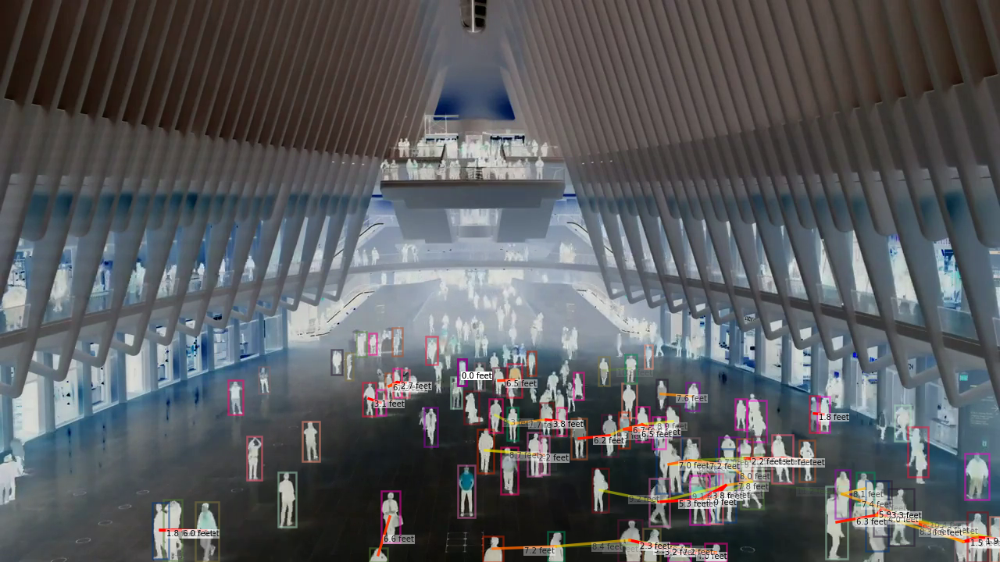

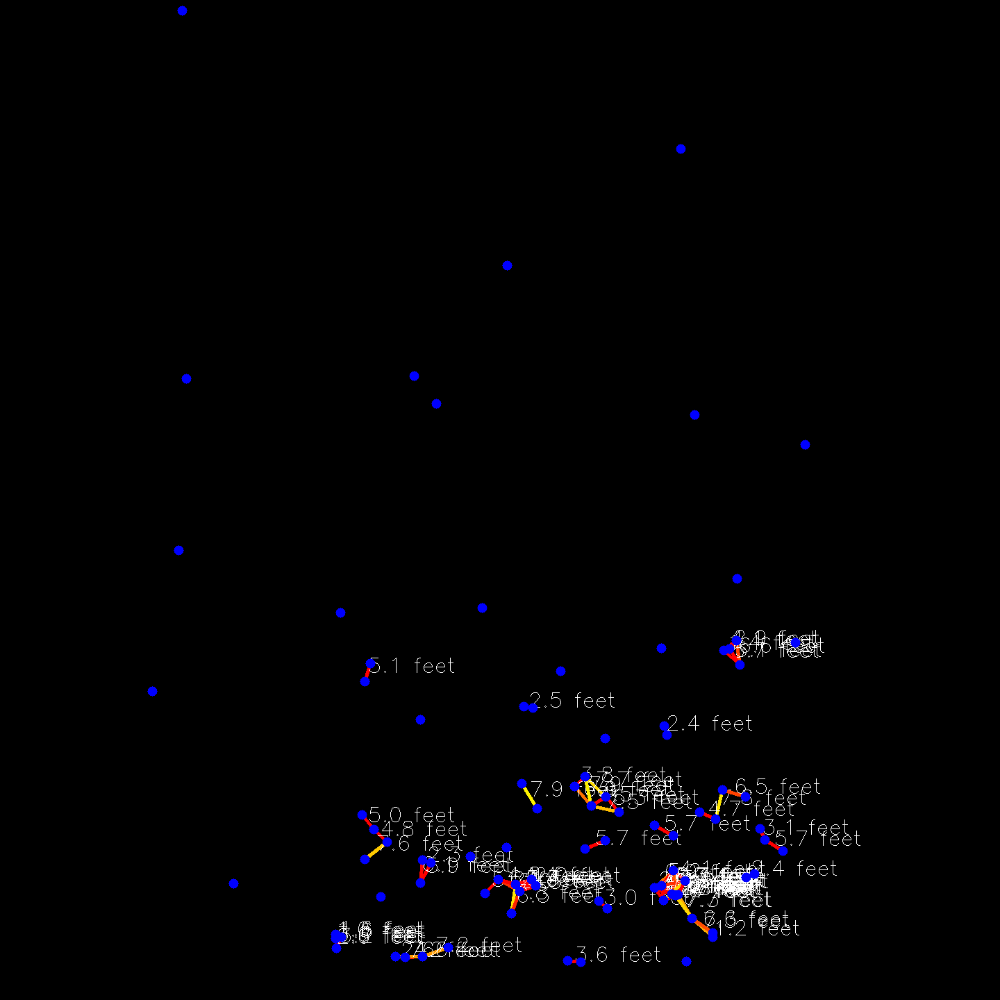

In [ ]:
WRITE_DEMO = True
WRITE_BIRDSEYE_DEMO = False
# Set the above to True to write to file, false to only view the first frame
# This code is commented very heavily to demonstrate how to use the demo code
# This fixes a bug I've been having when overwriting a video file
if WRITE_DEMO:
  ! rm demo.avi

if WRITE_BIRDSEYE_DEMO:
  ! rm be_demo.avi
# The image points are the corners of a rectangle on the original image.
# I selected this by assuming that the floor tiles in the original video are
# square, and then choosing a box to draw around. The specific pixel coordinates
# were found by manual inspection of the image in an image processing software.

im_pts = [[528, 683], [618, 682], [521, 707], [618, 706]] # found manually

# To visualize the points, set SEE_IMPOINTS to true
# This is not necessary at all to run the code, but is helpful to understand
# how the homography is found.
SEE_IMPOINTS = False
if SEE_IMPOINTS:
  cap = cv2.VideoCapture('oculus.mp4-reenc.avi')
  _, frame = cap.read()
  cap.release()
  for pt in im_pts:
    pt = tuple(pt)
    cv2.circle(frame, pt, 5, (255, 0, 0), 2)
  cv2_imshow(frame)

# These points were selected by estimating the width of a person's shoulders
# and then extrapolating to get two points 6 feet apart in the scene.
# The points do not have to be 6 feet apart, just some known distance.
ft6 = [[603, 659], [658, 659]] #two points ~6 feet apart in the scene
SEE_6FT = False
if SEE_6FT:
  cap = cv2.VideoCapture('oculus.mp4-reenc.avi')
  _, frame = cap.read()
  cap.release()
  for pt in ft6:
    pt = tuple(pt)
    cv2.circle(frame, pt, 5, (255, 0, 0), 2)
  cv2_imshow(frame)

# The hull is also selected manually. The hull is a series of points that lie
# around the region we are interested in visualizing people's locations within in
# the visualization. 
#   The hull matters mostly around the upper parts of the image--setting the hull too high
# will result in the visualization being far too large. Imagine if the floor went on
# until it was at that location in the image, that is how large the birdseye view
# will be.
hull = np.array([[1280, 720], [1280, 534], [750, 460], [440, 470], [0, 545], [0, 720]])
# Set SEE_HULL to true to see where the hull points are located.
SEE_HULL = False
if SEE_HULL:
  cap = cv2.VideoCapture('oculus.mp4-reenc.avi')
  _, frame = cap.read()
  cap.release()
  for pt in hull:
    pt = tuple(pt)
    cv2.circle(frame, pt, 15, (255, 0, 0), 3)
  cv2_imshow(frame)

# The bounding box describes the size of the birdseye view visualization in pixels.
FINAL_BOUNDING_BOX_SIZE = (1440, 1440)

# The filename is the filename of the video to read which matches the tracks provided
filename = 'oculus.mp4-reenc.avi'

# The VideoWriters are to write to file, and the fourcc is an opencv specific necessity.
fourcc = cv2.VideoWriter_fourcc(*'XVID')
if WRITE_DEMO:
  out = cv2.VideoWriter('demo.avi', fourcc, 25, (1280, 720))

if WRITE_BIRDSEYE_DEMO:
  out2 = cv2.VideoWriter('be_demo.avi', fourcc, 15, (1440, 1440))

# Here, we initialize a depth estimator, which we will then calibrate.
de = DepthEstimator()

# Here, we compute the homography based on the im_pts described above.
# The aspect ratio is because the square we used to select our points
# is 4 squares wide and 3 squares tall. The specific order the points
# must be selected in is described in the docs of the function.
de.estimate_H_from_rectangle(im_pts, aspect_ratio=(400, 300))

# Then, we estimate the scale from the points above.
# IMPORTANT NOTE: This must happen *after* the homography estimation
de.estimate_scale_from_points(ft6[0], ft6[1], 6.0, units='feet')

# We then create a visualizer based on the depth estimator.
dv = DepthVisualizer(de)

# For an exponential fade, we define a custom function for transparency based
# on distance
def fade(x):
  if x < 6: # Fully visible when inside social distancing range
    return 1
  #elif x > 20:
  #  return 0
  x = (x - 6) * .13 # Magic number
  return np.exp(-x)

# frame_gen is a generator, so we can iterate through it
frame_gen = dv.generator_distance_lines(
    filename,
    tracks,
    show_time=True,
    demo_invert=True,
    MAX_DIST_FEET=12.0,
    )

SHORTEN = False
if WRITE_DEMO:
  if SHORTEN:
    i = 0
  for frame in frame_gen:
    if SHORTEN:
      i += 1
      if i > 150:
        break
    f1 = frame
    out.write(frame)
else:
  f1 = next(frame_gen)

cv2_imshow(f1)

frame_gen_be = dv.generator_distance_lines_birdseye(tracks, hull, FINAL_BOUNDING_BOX_SIZE)
if WRITE_BIRDSEYE_DEMO:
  for frame in frame_gen_be:
    f2 = frame
    out.write(f2)
else:
  f2 = next(frame_gen_be)

cv2_imshow(f2)
#f2 = next(frame_gen_be)
#cv2_imshow(f2)
# Use this code below to write with the outputs.
#for frame in frame_gen_be:
#  out2.write(frame)


In [ ]:
! rm bg-neg-zoom.mp4 final_watermark.avi final_watermark.mp4
cap = cv2.VideoCapture('demo_final.avi')
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('final_watermark.avi', fourcc, 24, (1280, 720))
msg = "ContactTracingAI.com\nCopyright 2020 MLDSAI Inc. All Rights Reserved."
while True:
  ret, frame = cap.read()
  if not ret:
    break
  viz = Visualizer(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
  viz.output.ax.text(
      640,
      400,
      msg,
      size=30,
      family="serif",
      horizontalalignment='center',
      verticalalignment='center',
      color=(1, 1, 1),
      alpha=.35
  )
  frame = cv2.cvtColor(viz.output.get_image(), cv2.COLOR_RGB2BGR)
  out.write(frame)

cap.release()

In [ ]:
## ffmpeg code stuff
ffmpeg = imageio.plugins.ffmpeg                                                
try:                                                                           
    ffmpeg.download()                                                          
except:                                                                        
    pass                                                                       
ffmpeg_exe = ffmpeg.get_exe()

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)901120/45929032 bytes (2.0%)2408448/45929032 bytes (5.2%)4784128/45929032 bytes (10.4%)7954432/45929032 bytes (17.3%)10690560/45929032 bytes (23.3%)14491648/45929032 bytes (31.6%)18096128/45929032 bytes (39.4%)21790720/45929032 bytes (47.4%)25051136/45929032 bytes (54.5%)28278784/45929032 bytes (61.6%)31686656/45929032 bytes (69.0%)35119104/45929032 bytes (76.5%)38715

In [ ]:
# Convert it to mp4
! ffmpeg -i final_watermark.avi final_watermark.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [ ]:
#
! ffmpeg -i final_watermark.mp4 -vcodec h264 -an -ss 0 -t 20 -vf "scale=8000:-1,zoompan=z='if(lte(pzoom,1.0),1.3,max(1.001,pzoom-0.0005))':x='iw/2.6-iw/zoom/2.6':y='ih/1.6-ih/zoom/1.6':d=1:s=1280x720:fps=30" bg-neg-zoom.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [ ]:
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
          viz = Visualizer(frame)

### Track Testing

In [ ]:
! rm track_demo.avi
vid = cv2.VideoCapture('oculus.mp4-reenc.avi')
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('track_demo.avi', fourcc, 25, (1280, 720))
tracker = cv2.TrackerCSRT_create()
success = True
initialized = False
while success:
  ret, frame = vid.read()
  if not initialized:
    bbox = tuple([592, 493, 612 - 592, 542 - 493])
    tracker.init(frame, bbox)
  tracker.init(f1, bbox)
  if not ret:
    break
  success, box = tracker.update(frame)
  if success:
    x, y, w, h = box
    cv2.rectangle(frame, (int(x), int(y)), (int(x + w), int(y + h)), (0, 255, 0), 2)
  out.write(frame)

vid.release()
#cv2_imshow(frame)




### Old Procedural Code
Creates demo without using depth visualizer much

In [ ]:
de = DepthEstimator()
im_pts = [[528, 683], [618, 682], [521, 707], [618, 706]] # found manually
de.estimate_H_from_rectangle(im_pts, aspect_ratio=(400, 300))

print(tracks.shape)
hull = np.array([[1280, 720], [1280, 534], [750, 460], [440, 470], [0, 545], [0, 720]])
FINAL_BOUNDING_BOX_SIZE = (1440, 1440)

dv = DepthVisualizer(de)
#dv.visualize_from_tracks(tracks, hull, FINAL_BOUNDING_BOX_SIZE, 'viz_test.mp4', yval=425, disp_hull=True)

(819, 810, 4)


In [ ]:
#### This cell contains the original code to produce the demo
# Necessary to avoid weird stuff with the video writer--do not remove
! rm demo.avi
! rm be_demo.avi

MAX_DIST = 8.0 # feet, max distance to draw
FONT = cv2.FONT_HERSHEY_SIMPLEX
TEST = False # show the frames, quit after first frame

hull = np.array([[1280, 720], [1280, 534], [750, 460], [440, 470], [0, 545], [0, 720]])
FINAL_BOUNDING_BOX_SIZE = (1440, 1440)
im_pts = [[528, 683], [618, 682], [521, 707], [618, 706]] # found manually


orig_vid = cv2.VideoCapture('oculus.mp4-reenc.avi')
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('demo.avi', fourcc, 25, (1280, 720))
out2 = cv2.VideoWriter('be_demo.avi', fourcc, 25, (1440, 1440))
de = DepthEstimator()
im_pts = [[528, 683], [618, 682], [521, 707], [618, 706]] # found manually
ft6 = [[603, 659], [658, 659]] #two points ~6 feet apart in the scene
de.estimate_H_from_rectangle(im_pts, aspect_ratio=(400, 300))
de.estimate_scale_from_points(ft6[0], ft6[1], 6.0, units='feet')
dv = DepthVisualizer(de)

bot_tracks = []
for i in range(len(tracks)):
  track = tracks[i]
  track = DepthVisualizer.convert_boxes_to_botmid(track)
  track = DepthVisualizer.nan_above_yval(track, 425)
  bot_tracks.append(track)

center_tracks = []
for i in range(len(tracks)):
  track = tracks[i]
  track = DepthVisualizer.convert_boxes_to_center(track)
  track = DepthVisualizer.nan_above_yval(track, 425)
  center_tracks.append(track)
  # TODO: Implement center point function

birds_eye_tracks = []
for i in range(len(bot_tracks)):
  track = bot_tracks[i]
  track = de.transform_points(track, verbose=False)
  birds_eye_tracks.append(track)

pix_transform = dv.get_pixel_transform_from_convex_hull(hull, (1440, 1440))
pix_tracks = dv.get_pixel_tracks(tracks, pix_transform)

pos_by_frame = []
index_by_frame = [] # to store index of corresponding elements of pos_by_frame
for t in range(tracks.shape[1]):
  # iterate over timesteps
  pos_frame_t = []
  index_frame_t = []
  for i in range(len(birds_eye_tracks)):
    pt = birds_eye_tracks[i][t]
    if any(np.isnan(pt)):
      continue
    else:
      pos_frame_t.append(pt)
      index_frame_t.append(i)
  pos_by_frame.append(np.array(pos_frame_t, dtype=np.float32))
  index_by_frame.append(index_frame_t)


for t in range(tracks.shape[1]):
  ret, frame = orig_vid.read()
  frame2 = np.zeros((1440, 1440, 3), dtype=np.uint8)
  pos_now = pos_by_frame[t]
  indices_now = index_by_frame[t]
  # To convert from pos_now index to track index, use
  # track_index = indices_now[pos_now_index]
  # Use a KD Tree to calculate people that are <8 ft from eachother
  kd_pos = scipy.spatial.cKDTree(pos_now)
  close_pts = kd_pos.query_pairs(MAX_DIST)
  # Above is a set of indices (i, j) of pos_now where d(i, j) <= MAX_DIST
  for i, j in close_pts:
    # In order, index, point, birdseye point, pixel
    tr_i = indices_now[i]
    tr_j = indices_now[j]

    pt_i = center_tracks[tr_i][t]
    if np.isnan(pt_i).any():
      continue
    pt_i = (int(pt_i[0]), int(pt_i[1]))
    birdseye_i = birds_eye_tracks[tr_i][t]
    pix_i = pix_tracks[tr_i][t]
    pix_i = (int(pix_i[0]), int(pix_i[1]))


    pt_j = center_tracks[tr_j][t]
    if np.isnan(pt_j).any():
      continue
    pt_j = (int(pt_j[0]), int(pt_j[1]))
    birdseye_j = birds_eye_tracks[tr_j][t]
    pix_j = pix_tracks[tr_j][t]
    pix_j = (int(pix_j[0]), int(pix_j[1]))

    # Center points of the lines to write text
    pt_ct_0 = int(float(pt_i[0] + pt_j[0]) / 2)
    pt_ct_1 = int(float(pt_i[1] + pt_j[1]) / 2)
    pt_ct = (pt_ct_0, pt_ct_1)
    pix_ct_0 = int(float(pix_i[0] + pix_j[0]) / 2)
    pix_ct_1 = int(float(pix_i[1] + pix_j[1]) / 2)
    pix_ct = (pix_ct_0, pix_ct_1)


    d = np.linalg.norm(birdseye_i - birdseye_j)
    #TODO: Replace with gradual coloring
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","yellow","green"])
    norm = matplotlib.colors.Normalize(vmin=6, vmax=8, clip=True)
    color = np.array(cmap(norm(d))[0:3])*255
    color = (color[2],color[1],color[0])
    #if d > 6:
    #  color = (0, 255, 0)
    #else:
    #  color = (0, 0, 255)
    cv2.line(frame2, pix_i, pix_j, color, 4)
    cv2.putText(frame2, '%.1f %s' % (d, de._units), pix_ct, FONT, .5, (0, 0, 0), thickness=3)
    cv2.putText(frame2, '%.1f %s' % (d, de._units), pix_ct, FONT, .5, (255, 255, 255), thickness=2)


  # Write points on birdseye map
  for i in range(len(pix_tracks)):
    pt = pix_tracks[i][t]
    if np.isnan(pt).any():
      continue
    pt = (int(pt[0]), int(pt[1]))
    cv2.circle(frame2, pt, 7, (255, 0, 0), -1)

  out2.write(frame2.astype(np.uint8))
  out.write(frame.astype(np.uint8))



orig_vid.release()
# tracks is of shape 819, 810, 4 (track_id, timestep, (x1, y1, x2, y2))
# Draw boxes onto the image
# Calculate centers and bottom middle of each individual
# Transform the bottom middle into bird's eye, keeping list ordering above
# Put those points into an efficient nearby lookup structure
# If < threshold, pass back the distance and the pairs of points
# Use those pairs to draw back onto original image as well as onto birds eye image
# Add the distance to the line (plt or cv2?)
# splice together the two videos and then once successful put the whole thing into
#   the visualizer

rm: cannot remove 'be_demo.avi': No such file or directory


KeyboardInterrupt: ignored

# Old code
No need to look at this for anything, just keeping it in case there's something I need in it

## Downloading and Running DenseDepth

In [ ]:
! git clone https://github.com/ialhashim/DenseDepth.git
! wget https://s3-eu-west-1.amazonaws.com/densedepth/nyu.h5 -O ./DenseDepth/nyu.h5
! wget https://s3-eu-west-1.amazonaws.com/densedepth/kitti.h5 -O ./DenseDepth/kitti.h5

Cloning into 'DenseDepth'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 238 (delta 0), reused 1 (delta 0), pack-reused 235
Receiving objects: 100% (238/238), 11.80 MiB | 6.03 MiB/s, done.
Resolving deltas: 100% (115/115), done.
--2020-07-11 00:49:12--  https://s3-eu-west-1.amazonaws.com/densedepth/nyu.h5
Resolving s3-eu-west-1.amazonaws.com (s3-eu-west-1.amazonaws.com)... 52.218.106.2
Connecting to s3-eu-west-1.amazonaws.com (s3-eu-west-1.amazonaws.com)|52.218.106.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 172897376 (165M) [application/h5]
Saving to: ‘./DenseDepth/nyu.h5’

./DenseDepth/nyu.h5 100%[===================>] 164.89M  11.5MB/s    in 16s     

2020-07-11 00:49:30 (10.1 MB/s) - ‘./DenseDepth/nyu.h5’ saved [172897376/172897376]

--2020-07-11 00:49:31--  https://s3-eu-west-1.amazonaws.com/densedepth/kitti.h5
Resolving s3-eu-west-1.amazonaws.com (s3-

Using TensorFlow backend.
Loading model...
Instructions for updating:
If using Keras pass *_constraint arguments to layers.




Model loaded (nyu.h5).

Loaded (8) images of size (480, 640, 3).

<Figure size 1000x500 with 1 Axes>


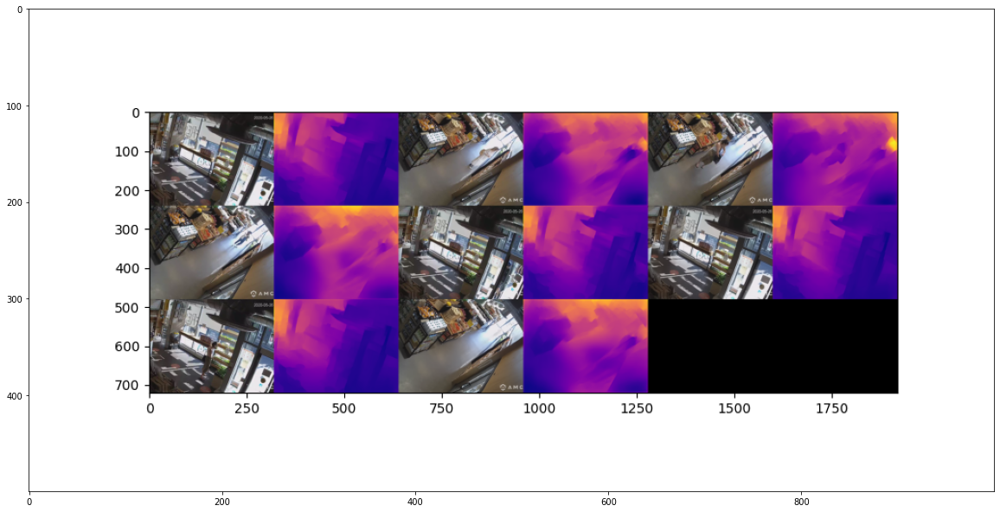

In [ ]:
! cd DenseDepth; python test.py --model "nyu.h5" --input "./../sample_frames/*.png"

plt.figure(figsize=(20,20))
plt.imshow( io.imread('./DenseDepth/test.png') )

In [ ]:
! cd DenseDepth; python demo.py

qt.qpa.xcb: could not connect to display 
qt.qpa.plugin: Could not load the Qt platform plugin "xcb" in "" even though it was found.
This application failed to start because no Qt platform plugin could be initialized. Reinstalling the application may fix this problem.

Available platform plugins are: eglfs, linuxfb, minimal, minimalegl, offscreen, vnc, wayland-egl, wayland, wayland-xcomposite-egl, wayland-xcomposite-glx, webgl, xcb.

/bin/bash: line 1:  2360 Aborted                 (core dumped) python demo.py


In [ ]:
# Use the Utils functions to process the videos
VID_PATHS = ["./test1.mp4", "./test2.mp4"]
vid_frames = []

for video_path in VID_PATHS:
  vid_frames.append(get_background(video_path))
  vid_frames.extend(pull_n_frames_from_video(video_path, 3))

! mkdir sample_frames

for frame, i in zip(vid_frames, range(len(vid_frames))):
  cv2.imwrite('sample_frames/test_img_%d.png' % i, resize_frame(frame))

In [ ]:
# Imports to use functions
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '5'
from DenseDepth.layers import BilinearUpSampling2D
from DenseDepth.utils import predict, load_images, display_images

# Custom object needed for inference and training
custom_objects = {'BilinearUpSampling2D': BilinearUpSampling2D, 'depth_loss_function': None}

In [ ]:
# Load in Model
MODEL_PATH = 'DenseDepth/nyu.h5'

print("Loading model...")
model = load_model(MODEL_PATH, custom_objects=custom_objects, compile=False)

Loading model...
Instructions for updating:
If using Keras pass *_constraint arguments to layers.





In [ ]:
inputs = load_images(glob.glob("test_img3.png"))

In [ ]:
inputs = np.stack([resize_frame(inputs[0])], axis=0)
inputs.shape

(1, 480, 640, 3)

In [ ]:
outputs = predict(model, inputs)
output_not_normalized = model.predict(inputs, batch_size=1)

In [ ]:
inputs_large = load_images(glob.glob("test_img3.png"))
#outputs = predict(model, inputs_large, batch_size=1)

## Using Perspective Transform on Oculus

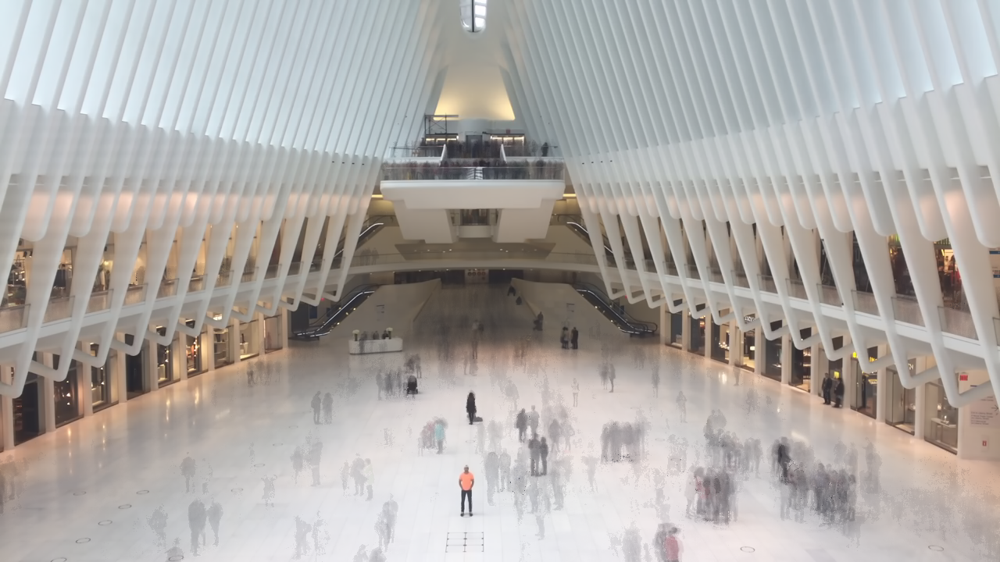

In [ ]:
bg = get_background('oculus.mp4')
cv2_imshow(bg)

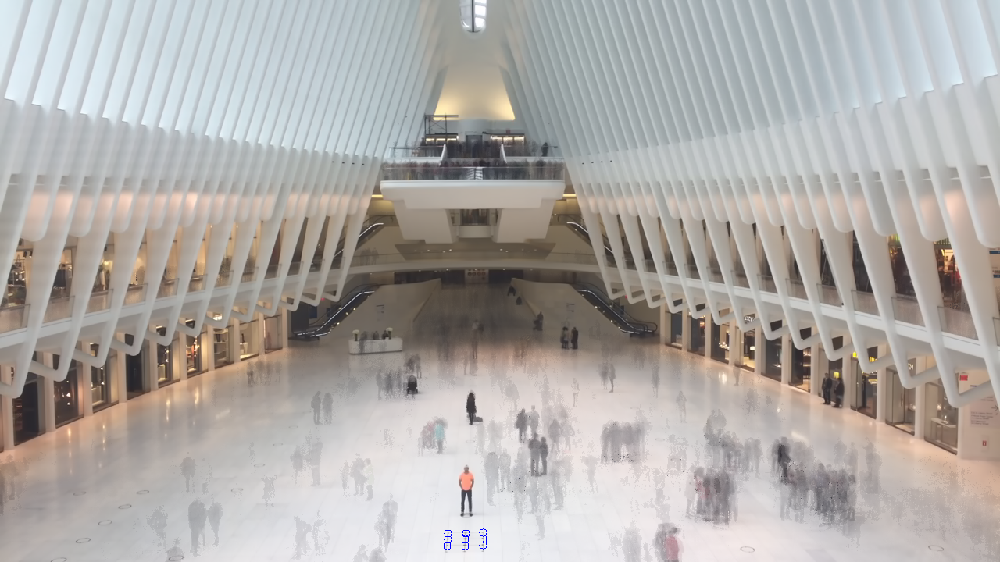

In [ ]:
# Estimate the corners of the 2x2 blackened floor tiles at the bottom center by hand to check method
im_pts_list = [[573, 683], [596, 683], [618, 682], [573, 691], [595, 690], [618, 690], [572, 699], [595, 699], [618, 698]]
obj_pts = np.zeros((3 * 3, 3), np.float32)
obj_pts[:,:2] = np.mgrid[0:3, 0:3].T.reshape(-1,2)
bg_temp = bg.copy()
for pt in im_pts_list:
  cv2.circle(bg_temp, (pt[0], pt[1]), 5, (255, 0, 0))

cv2_imshow(bg_temp)

im_pts = np.array(im_pts_list, np.float32)
im_pts, obj_pts = np.array([im_pts], np.float32), np.array([obj_pts], np.float32)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_pts, im_pts, bg.shape[::-1][1:], None, None)

In [ ]:
h,  w = bg.shape[:2]
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
dst = cv2.undistort(bg, mtx, dist, None, newcameramtx)

In [ ]:
im_pts_4 = np.array([[573, 683], [618, 682], [572, 699], [618, 698]], np.float32)
out_pts_4 = np.array([[550, 675], [600, 675], [550, 725], [600, 725]], np.float32)
for i in range(len(out_pts_4)):
  for j in [0, 1]:
    out_pts_4[i, j] += 500
T = cv2.getPerspectiveTransform(im_pts_4, out_pts_4)


In [ ]:
warped = cv2.warpPerspective(bg, T, (2000, 2000))
cv2_imshow(warped)

In [ ]:
### Let's try with a homography! AHHH
T2 = cv2.findHomography(im_pts_4, out_pts_4)
#warped2 = cv2.warpPerspective(bg, T2, (2000, 2000))
#cv2_imshow(warped2)

tuple

## Perspective Transform on Sample Video

In [ ]:
f1 = get_background('test1.mp4')
f2 = get_background('test2.mp4')
f3 = get_background('test3.mp4')

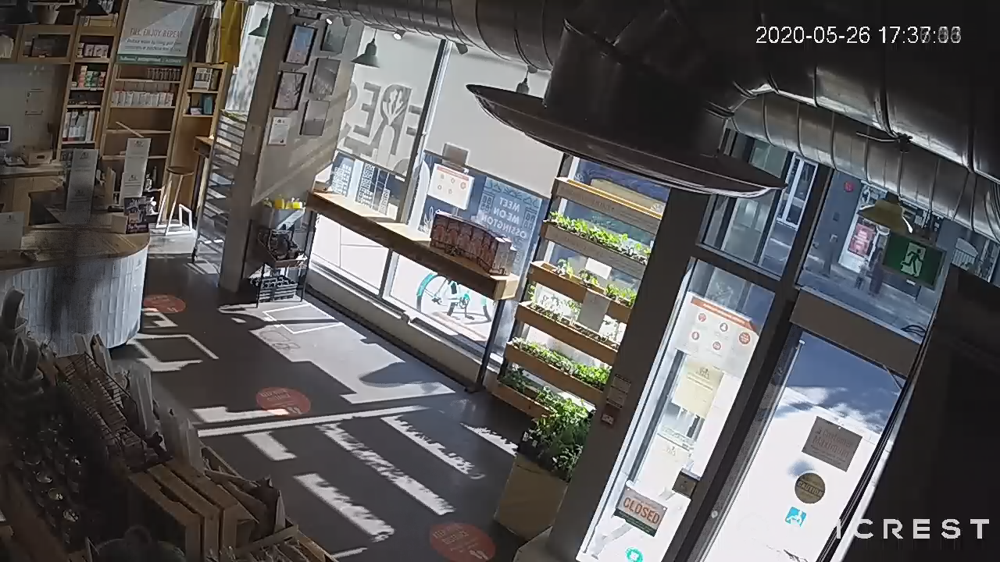

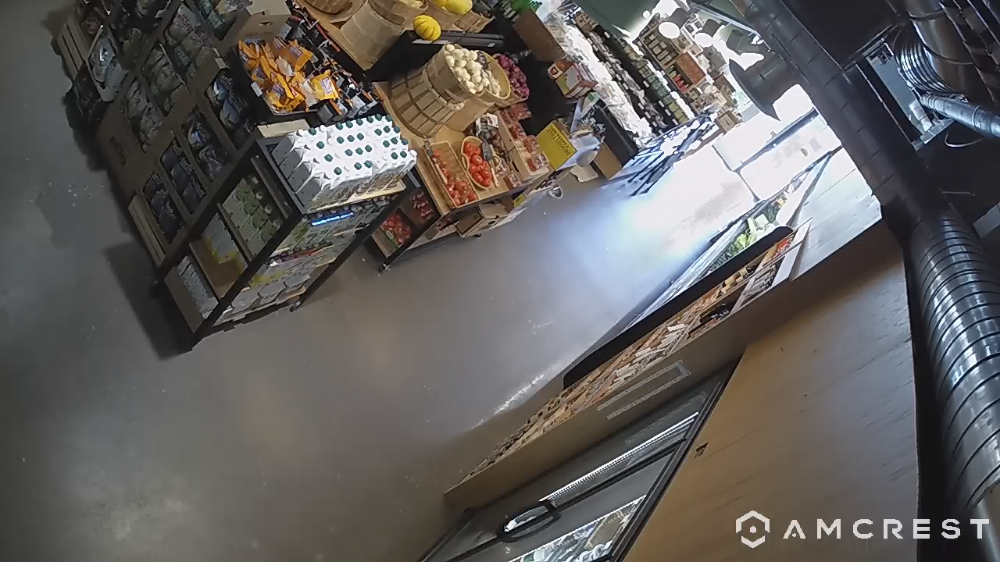

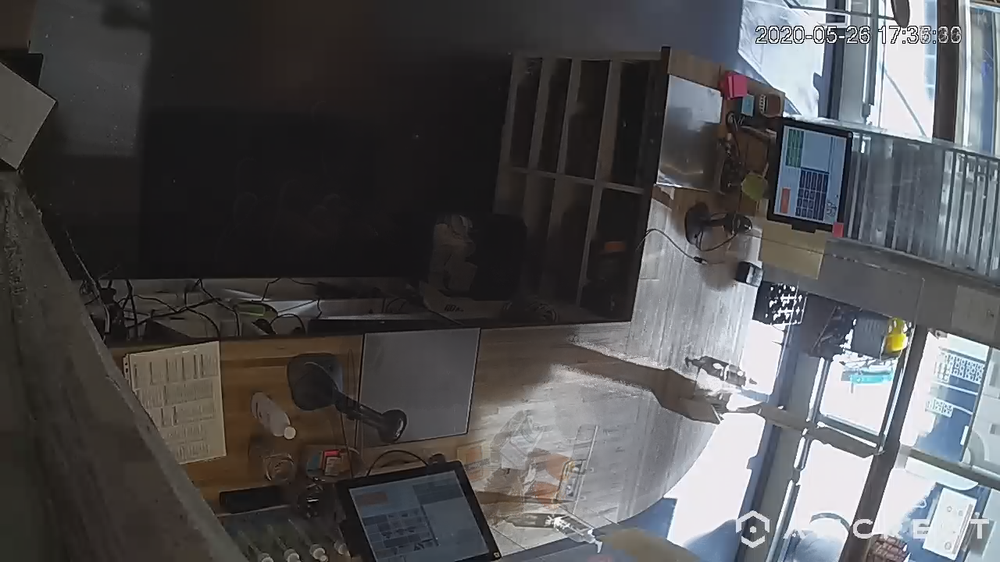

In [ ]:
cv2_imshow(f1)
cv2_imshow(f2)
cv2_imshow(f3)

In [ ]:
IMG_NUM = 1
if IMG_NUM == 1:
  im_pts = np.array([[339, 400], [397, 390], [376, 427], [438, 415]], np.float32)
  obj_pts = np.array([[500, 500], [500, 550], [550, 500], [550, 550]], np.float32)
  H = cv2.findHomography(im_pts, obj_pts)[0]
  out = cv2.warpPerspective(f1, H, (1000, 1000))
  cv2_imshow(cv2.flip(out, 0))
elif IMG_NUM == 2:
  pass
elif IMG_NUM == 3:
  im_pts = np.array([[468, 428], [615, 420], [455, 577], [598, 556]], np.float32)
  obj_pts = np.array([[500, 500], [500, 550], [550, 500], [550, 550]], np.float32)
  H = cv2.findHomography(im_pts, obj_pts)[0]
  out = cv2.flip(cv2.warpPerspective(f3, H, (1000, 1000)), 0)
  cv2_imshow(out)

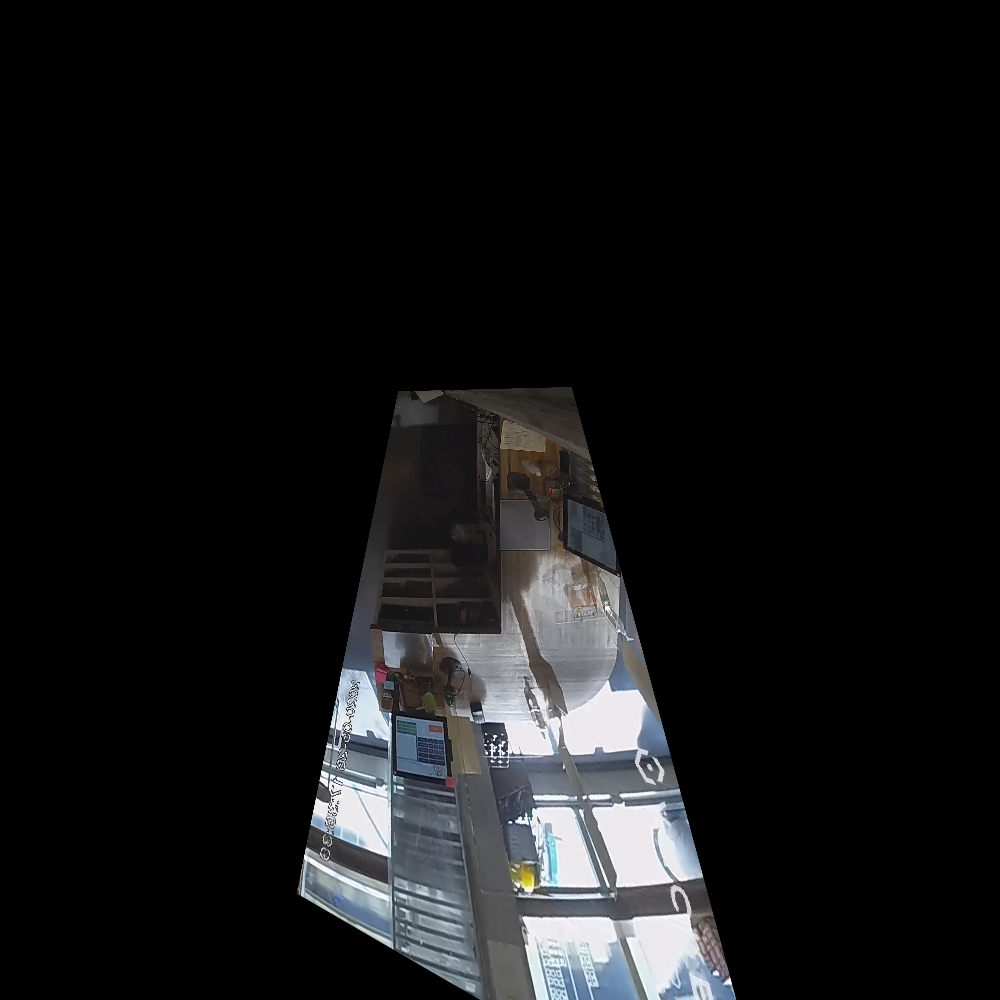

In [ ]:
cv2_imshow(out)

## Oculus Perspective with DepthEstimator

In [ ]:
if 0:
  files.upload()

Saving oculus_bg.png to oculus_bg.png


(720, 1280, 3)


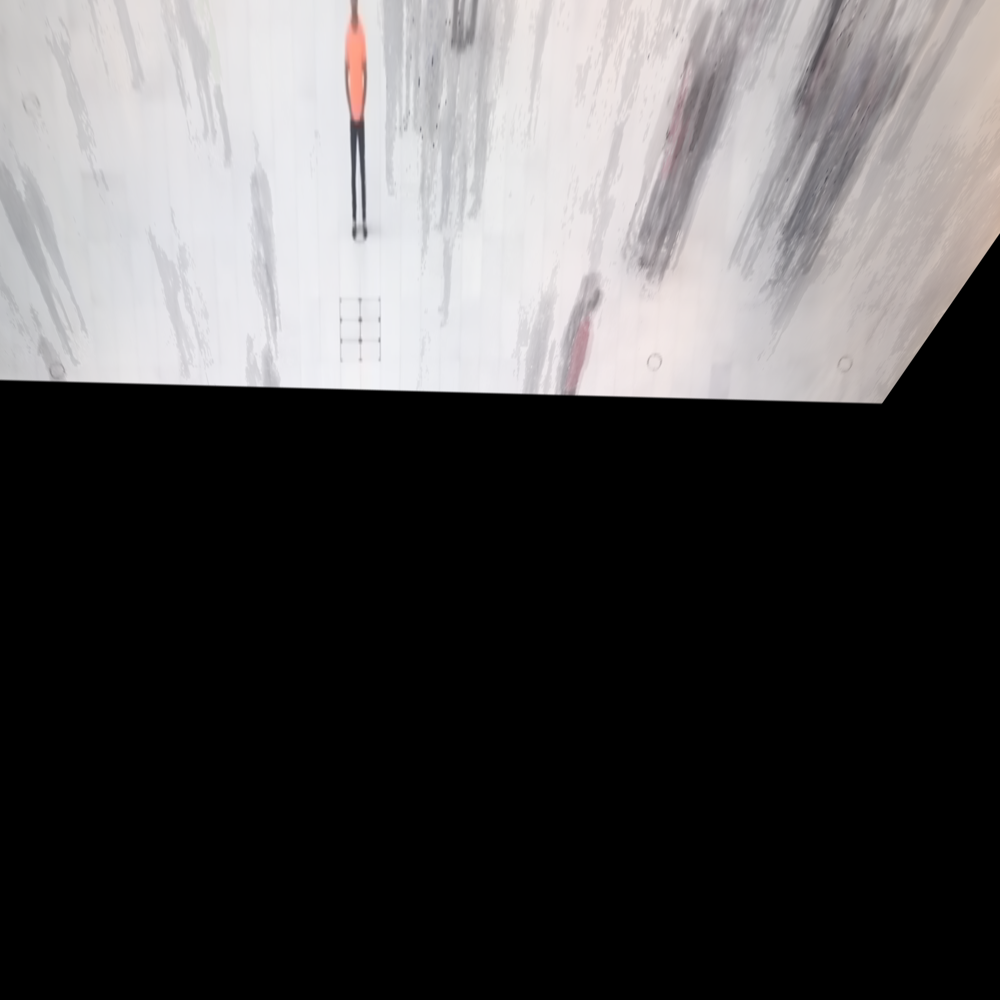

In [ ]:
oculus = cv2.imread('oculus_bg.png')
print(oculus.shape)

vp_oculus = 380 # cutoff to avoid vanishing point
im_pts = [[528, 683], [618, 682], [521, 707], [618, 706]]
im_pts = [[x, y - vp_oculus] for x, y in im_pts]
oculus = oculus[vp_oculus:, :]
im_pts = np.array(im_pts, np.float32)
obj_pts = np.array([[1500, 1500], [1900, 1500], [1500, 1800], [1900, 1800]], np.float32)


de = DepthEstimator()
#de.set_naive_camera_matrix(oculus.shape)
de.estimate_H_from_points(obj_pts, im_pts)
#de.estimate_H_from_rectangle(im_pts, aspect_ratio=(400, 300))
#H = cv2.findHomography(im_pts, obj_pts)[0]
cv2_imshow(cv2.warpPerspective(oculus, de._H, (5000, 5000)))
